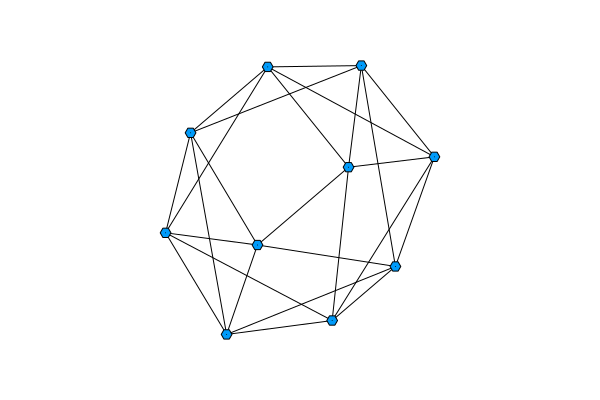

In [1]:
# Package imports
using Random
using Distributions
using Graphs
using GraphRecipes
using Plots

# 4th order Runge-Kutta solver for ODEs
function rk4(f::Function, t0::Float64, y0::Vector{Float64}, t1::Float64, n, p)
    vt = Vector{Float64}(undef, n + 1)
    vy = Matrix{Float64}(undef, n + 1, length(y0))
    vt[1] = t = t0
    vy[1, :] = y = y0
    h = (t1 - t0) / n
    for i in 1:n
        k1 = h * f(t, y, p)
        k2 = h * f(t + 0.5h, y + 0.5k1, p)
        k3 = h * f(t + 0.5h, y + 0.5k2, p)
        k4 = h * f(t + h, y + k3, p)
        vt[i + 1] = t = t0 + i * h
        vy[i + 1, :] = y = y + (k1 + 2k2 + 2k2 + k4) / 6
    end
    return vt, vy
end;

# Regularization constant
reg = 1e-3

# Relu function implementation
function relu(x)
    if (x > 0)
        return x
    else
        return 0
    end
end

# Step function implementation
function ustep(x)
    if (x > 0)
        return 1
    else
        return 0
    end
end

# The full market model
function model(t, w, p)
    b = p[1]
    d = p[2]
    r = p[3]
    a = p[4]
    c = p[5]
    g = p[6]
    diff = p[7]
    N = length(a)
    M = p[8]
    x = w[1:N]
    y = w[(N+1):(2*N)]
    z = w[(2*N+1):(3*N)]
    u = w[(3*N+1):(4*N)]
    Fun = zeros(4*N)
    for i in 1:N
        Fun[i] = b[i]*z[i] - d[i]*x[i]
        Fun[i+N] = (r[i]*y[i]*(1-y[i]/(u[i]+reg)) - a[i]*x[i]*y[i])*ustep(y[i])
        Fun[i+2*N] = a[i]*x[i]*y[i] - c[i]*z[i]
        Fun[i+3*N] = diff[i]*relu(y'*M[i, :])-g[i]*u[i]
    end
    return Fun
end;

# Random regular graph of average degree 5
N = 10;
g = Graphs.SimpleGraphs.random_regular_graph(N, 5)
L = adjacency_matrix(g)

# Computing the Laplacian for diffusion
for i in 1:N
    L[i, i] = -(sum(L[i, :])-L[i, i])
end

# Plotting the technological dependency graph
graphplot(g, curves=false)

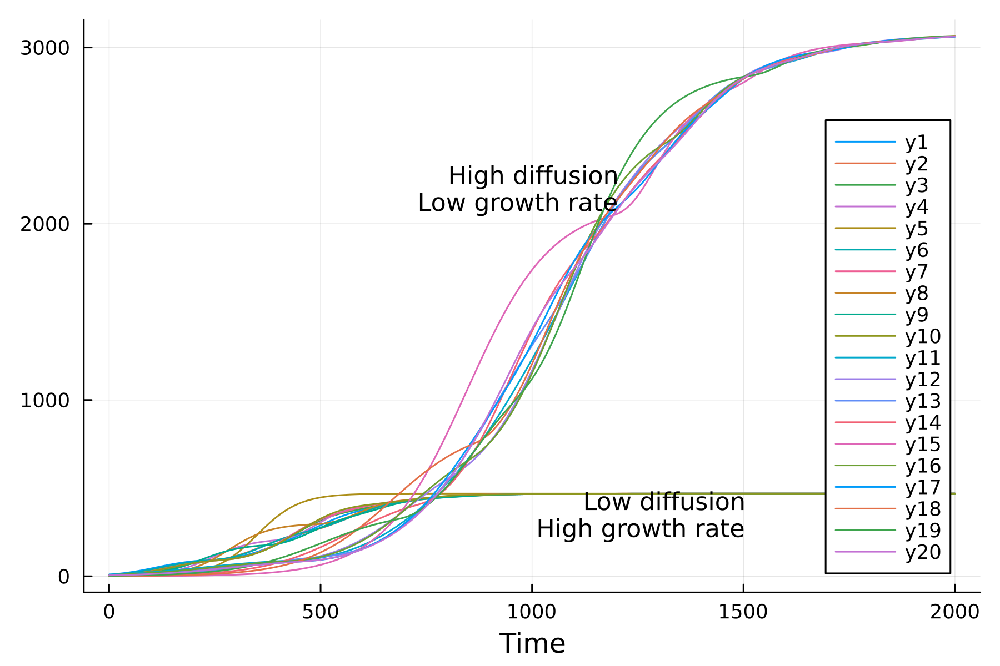

In [7]:
# Parametrisation for the pure diffusion model
b = 0
d = 0
r = 1e-2 # growth rare
u0 = 100 # market capacity
a = 0
c = 0
diff = 1e-2

# Network parameters
bN = b*rand(Normal(1, 0), N)
dN = d*rand(Normal(1, 0), N)
rN = r*rand(Normal(1, 0), N)
aN = a*rand(Normal(1, 0), N)
cN = c*rand(Normal(1, 0), N)
diffN = diff*rand(Normal(1, 0), N)

g = 0 # not used
gN = g*rand(Normal(1, 0), N); # not used

t = 2000
ns = 4
nsteps = ns*t

# Initial condtions
x = rand(Normal(1, 0), N)
y = 10 .* rand(Uniform(0, 1), N)
z = rand(Normal(1, 0), N)
u = rand(Normal(u0, 0), N)
W0 = vcat(x, y, z, u)

# Solving the ODE system for the pure diffusion model
vt1, vy1 = rk4(model, 0.0, W0, 1.0*t, nsteps, [bN, dN, 2*rN, aN, cN, gN, diffN, L]);
vt2, vy2 = rk4(model, 0.0, W0, 1.0*t, nsteps, [bN, dN, rN, aN, cN, gN, 2 .* diffN, L]);

# Plotting Figure 1c (low diffusion/high growth rate and high diffusion/low growth rate)
Plots.plot(vt1[1:20:end], vy1[1:20:end, (N+1):(2*N)], legend=:bottomright, dpi=300, xlabel="Time")
Plots.plot!(vt2[1:20:end], vy2[1:20:end, (N+1):(2*N)], legend=:bottomright, dpi=300)
annotate!(1200, 2200, text("High diffusion\n Low growth rate", :right, 10))
annotate!(1500, 350, text("Low diffusion\n High growth rate", :right, 10))
#savefig("1c.pdf")

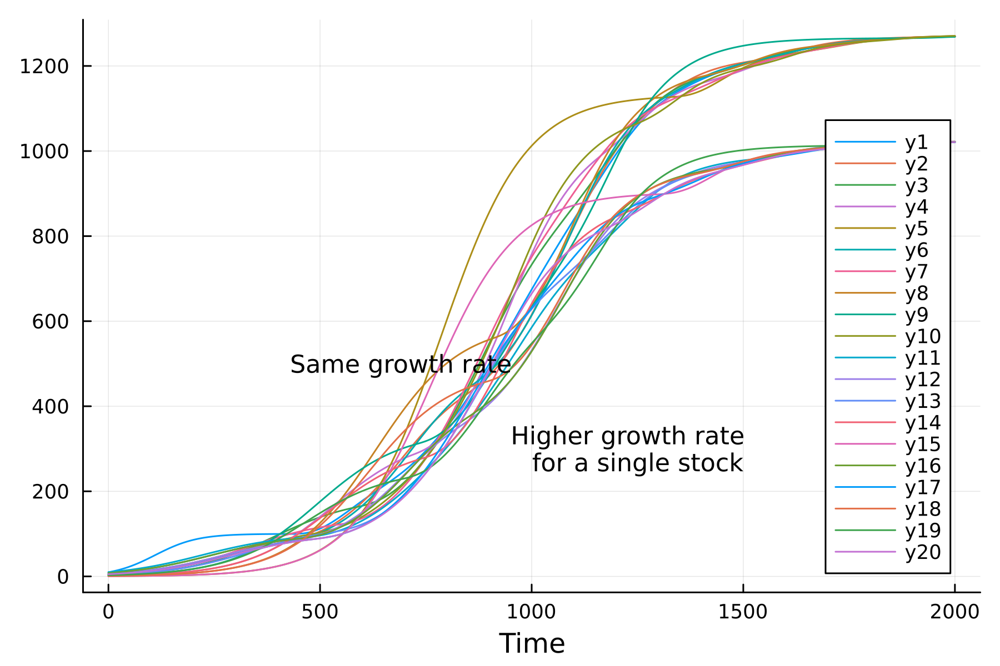

In [8]:
# Plotting Figure 1d (single stock with higher growth rare)
vt1, vy1 = rk4(model, 0.0, W0, 1.0*t, nsteps, [bN, dN, vcat([0.02], rN[2:end]), aN, cN, gN, diffN, L]);
vt2, vy2 = rk4(model, 0.0, W0, 1.0*t, nsteps, [bN, dN, rN, aN, cN, gN, diffN, L]);
Plots.plot(vt1[1:20:end], vy1[1:20:end, (N+1):(2*N)], legend=:bottomright, dpi=300, xlabel="Time")
Plots.plot!(vt2[1:20:end], vy2[1:20:end, (N+1):(2*N)], legend=:bottomright, dpi=300)
annotate!(1500, 300, text("Higher growth rate\n for a single stock", :right, 10))
annotate!(950, 500, text("Same growth rate", :right, 10))
#savefig("1d.pdf")

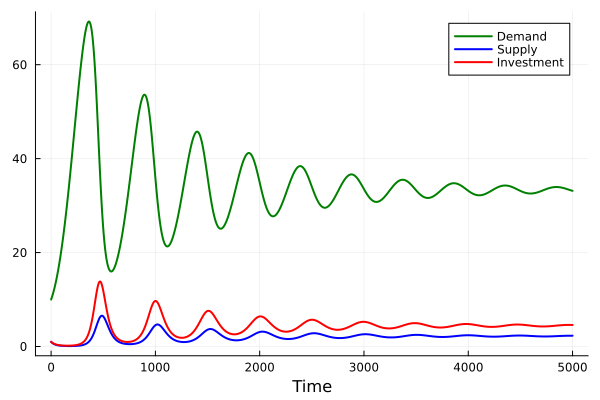

In [9]:
# Parametrisation for the busines cycle model
b = 2.5e-2
d = 5e-2
r = 1e-2
u0 = 100
a = 3e-3 # investment rate
c = 5e-2
diff = 0;

t = 5000
nsteps = ns*t

# Solving the ODE system for the busines cycle model (stable fixed point attractor)
vt1, vy1 = rk4(model, 0.0, [1., 10., 1., u0], 1.0*t, nsteps, [b, d, r, a, c, g, diff, [0]]);

# Plotting Figures 2a (stable fixed point attractor)
Plots.plot(vt1, vy1[:, 2],  linewidth = 2, linecolor="green", label = "Demand")
Plots.plot!(vt1, vy1[:, 1], linewidth = 2, linecolor="blue", label = "Supply")
Plots.plot!(vt1, vy1[:, 3],  linewidth = 2, linecolor="red", label = "Investment", xlabel = "Time")
#savefig("2a.pdf")

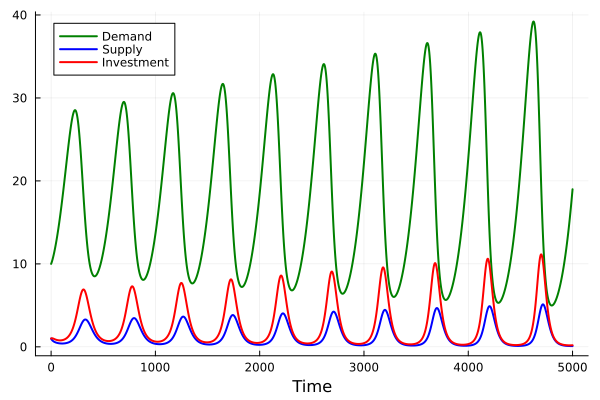

In [10]:
# Solving the ODE system for the busines cycle model (limit cycle attractor)
vt1, vy1 = rk4(model, 0.0, [1., 10., 1., u0], 1.0*t, nsteps, [b, d, r, 2*a, c, g, diff, [0]]);

# Plotting Figures 2b (limit cycle attractor)
Plots.plot(vt1, vy1[:, 2],  linewidth = 2, linecolor="green", label = "Demand")
Plots.plot!(vt1, vy1[:, 1], linewidth = 2, linecolor="blue", label = "Supply")
Plots.plot!(vt1, vy1[:, 3],  linewidth = 2, linecolor="red", label = "Investment", xlabel = "Time")
#savefig("2b.pdf")

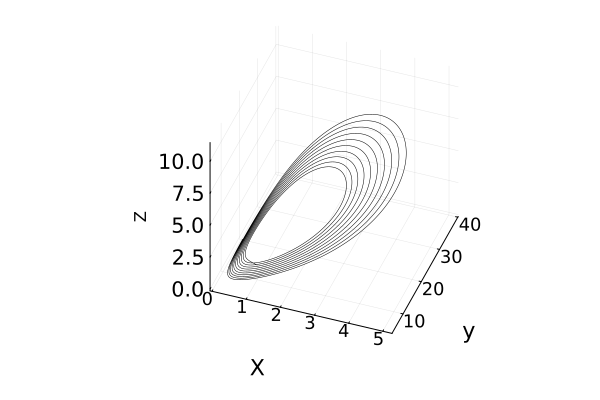

In [11]:
# Plotting Figure 2c (trajectory to limit cycle)
Plots.plot(vy1[:, 1], vy1[:, 2], vy1[:, 3], label="", c="black",
    linestyle=:solid, legend=false,
    xtickfontsize=12, ytickfontsize=12, ztickfontsize=14,
    xguidefontsize=15, yguidefontsize=15,
    legendfontsize=12, linewidth=0.5,
    xlabel="X", ylabel="y", zlabel="Z", padding=0, camera=(20,40))
#savefig("2c.pdf")

1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 

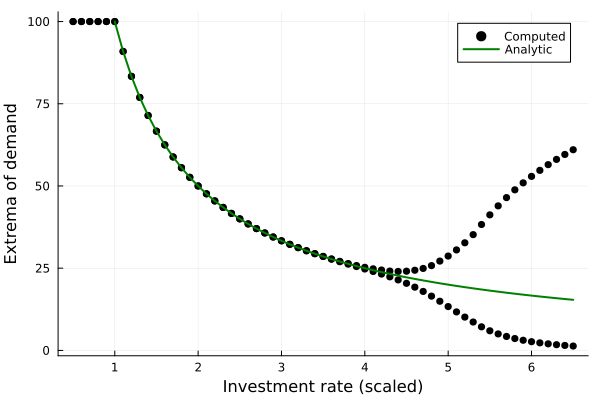

In [12]:
# Analytic results

#Equilibrium values for the demand, suply and investment
function y_eq(a, b, c, d)
    return c*d/(a*b)
end

function x_eq(a, b, c, d, r, u0)
    return r*(1-y_eq(a, b, c, d)/K)/a
end

function z_eq(a, b, c, d, r, u0)
    return d*x_eq(a, b, c, d, r, u0)/b
end

# Critical thresholds for the investment rate

# Transcritical bifurcation point
function a_0(b, c, d, u0)
    return c*d/(u0*b)
end

# Limit cycle bifurcation point
function a_c(b, c, d, r, u0)
    return (c^2+3*c*d+d^2+sqrt(c^4+6*c^3*d+11*c^2*d^2+4*c^2*d*r+6*c*d^3+4*c*d^2*r+d^4))/(2*u0*b)
end

# Computing the bifurcation diagram
a0 = a_0(b, c, d, u0)

num = 61
alist = LinRange(0.5, 6.5, num) .* 1e-3
minima = zeros(num)
maxima = zeros(num);

t = 20000
nsteps = ns*t

for i in 1:num
    print(i,' ')
    vt1, vy1 = rk4(model, 0.0, [1., 10., 1., u0], 1.0*t, nsteps, [b, d, r, alist[i], c, g, diff, [0]])
    minima[i] = minimum(vy1[floor(Int, nsteps*2/3):end, 2])
    maxima[i] = maximum(vy1[floor(Int, nsteps*2/3):end, 2])
end

# Plotting Figure 2d (the bifurcation diagram)
Plots.scatter(alist/a0, maxima, c="black", primary = false)
Plots.scatter!(alist/a0, minima, c="black", legend = true, xlabel="Investment rate (scaled)", ylabel="Extrema of demand", label="Computed")
Plots.plot!(alist[6:end]/a0, y_eq.(alist[6:end], b, c, d), c="green", linestyle=:solid, linewidth=2, label="Analytic")
#savefig("2d.pdf")

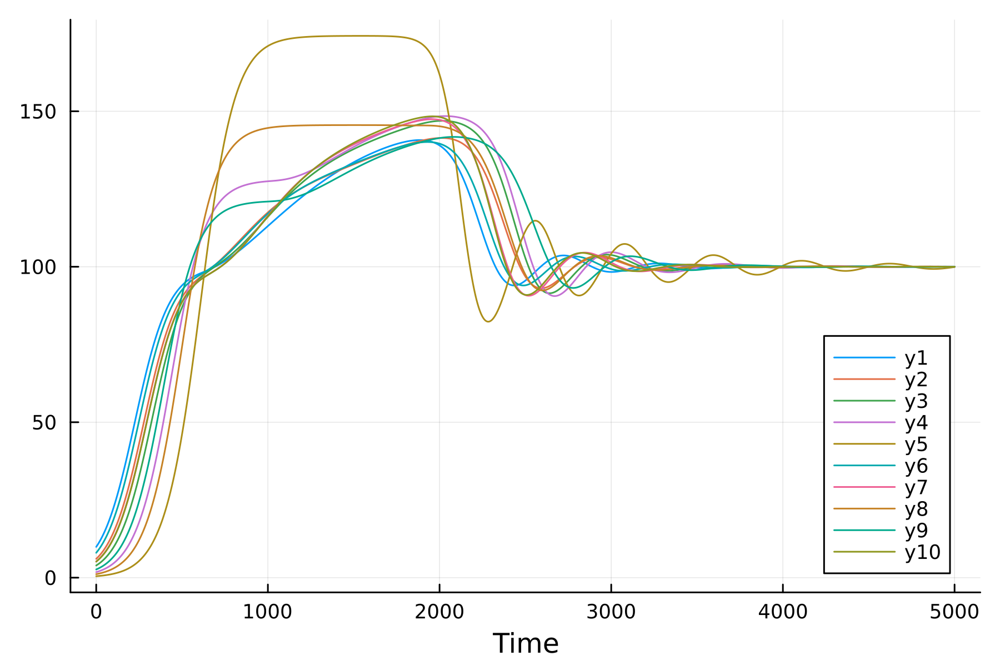

In [13]:
# Parametrisation for full model
a = 1e-3 # investment rate
diff = 1e-3 #d iffusion rate

bN = b*rand(Normal(1, 0), N)
dN = d*rand(Normal(1, 0), N)
rN = r*rand(Normal(1, 0), N)
aN = a*rand(Normal(1, 0), N)
cN = c*rand(Normal(1, 0), N)
diffN = diff*rand(Normal(1, 0), N);

t = 5000
nsteps = ns*t

# Plotting Figure 3a (steady state in the full model)
vt1, vy1 = rk4(model, 0.0, W0, 1.0*t, nsteps, [bN, dN, rN, aN, cN, gN, diffN, L]);
Plots.plot(vt1, vy1[:, (1*N+1):(2*N)], dpi=300, xlabel="Time", legend=:bottomright)
# savefig("3a.pdf")

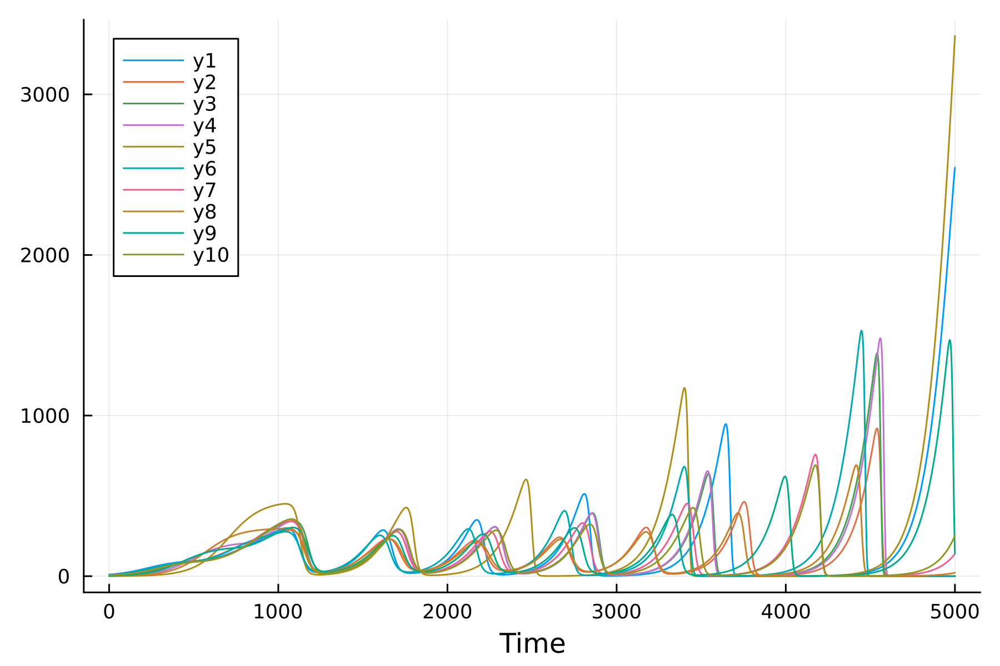

In [15]:
# Plotting Figure 3b (transient chaos in the full model)
vt2, vy2 = rk4(model, 0.0, W0, 1.0*t, nsteps, [bN, dN, rN, aN, cN, gN, 5*diffN, L]);
Plots.plot(vt2, vy2[:, (1*N+1):(2*N)], dpi=300, xlabel="Time", legend=:topleft)
# savefig("3b.pdf")

1 1 | 1 2 | 1 3 | 1 4 | 1 5 | 1 6 | 1 7 | 1 8 | 1 9 | 1 10 | 1 11 | 2 1 | 2 2 | 2 3 | 2 4 | 2 5 | 2 6 | 2 7 | 2 8 | 2 9 | 2 10 | 2 11 | 3 1 | 3 2 | 3 3 | 3 4 | 3 5 | 3 6 | 3 7 | 3 8 | 3 9 | 3 10 | 3 11 | 4 1 | 4 2 | 4 3 | 4 4 | 4 5 | 4 6 | 4 7 | 4 8 | 4 9 | 4 10 | 4 11 | 5 1 | 5 2 | 5 3 | 5 4 | 5 5 | 5 6 | 5 7 | 5 8 | 5 9 | 5 10 | 5 11 | 6 1 | 6 2 | 6 3 | 6 4 | 6 5 | 6 6 | 6 7 | 6 8 | 6 9 | 6 10 | 6 11 | 7 1 | 7 2 | 7 3 | 7 4 | 7 5 | 7 6 | 7 7 | 7 8 | 7 9 | 7 10 | 7 11 | 8 1 | 8 2 | 8 3 | 8 4 | 8 5 | 8 6 | 8 7 | 8 8 | 8 9 | 8 10 | 8 11 | 9 1 | 9 2 | 9 3 | 9 4 | 9 5 | 9 6 | 9 7 | 9 8 | 9 9 | 9 10 | 9 11 | 10 1 | 10 2 | 10 3 | 10 4 | 10 5 | 10 6 | 10 7 | 10 8 | 10 9 | 10 10 | 10 11 | 11 1 | 11 2 | 11 3 | 11 4 | 11 5 | 11 6 | 11 7 | 11 8 | 11 9 | 11 10 | 11 11 | 

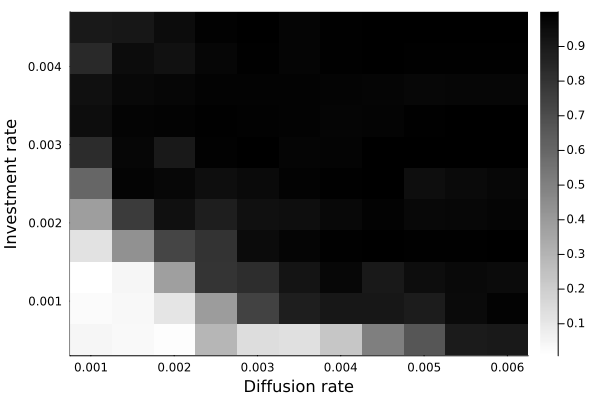

In [16]:
# Computing (y_max-y_min)/y_max for the full model
num = 11 # 61 for figure in paper
alist = LinRange(0.5, 4.5, num) * 1e-3
difflist = LinRange(1, 6, num) * 1e-3
var = zeros(num, num);

for i in 1:num
    for j in 1:num
        print(i, ' ', j, " | ")
        vt1, vy1 = rk4(model, 0.0, W0, 1.0*t, nsteps, [bN, dN, rN, alist[i]*ones(N), cN, gN, difflist[j]*ones(N), L])
        vy = mean.(eachrow(vy1[:, (1*N+1):(2*N)]))
        min = minimum(vy[floor(Int, nsteps*2/3):end])
        max = maximum(vy[floor(Int, nsteps*2/3):end])
        var[i, j] = 1 - min/(1e-2+max)
    end
end

# Plotting Figure 3c
heatmap(difflist, alist, var,
    c=cgrad([:white, :black]),
    xlabel="Diffusion rate", ylabel="Investment rate")
#savefig("3c.pdf")